In [26]:
# Queston 1

In [33]:
from pathlib import Path

import pandas as pd
from sklearn import preprocessing
from sklearn.model_selection import train_test_split,  cross_val_score, GridSearchCV
from sklearn.metrics import accuracy_score
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.neighbors import NearestNeighbors, KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
import matplotlib.pylab as plt
import matplotlib.pyplot as plt
from dmba import plotDecisionTree, classificationSummary, regressionSummary
from sklearn.model_selection import cross_val_score
from sklearn.neighbors import KNeighborsClassifier
import dmba
from sklearn import tree 
%matplotlib inline

In [2]:
bank_df = pd.read_csv('UniversalBank.csv')

In [3]:
bank_df.shape

(5000, 14)

In [4]:
bank_df.columns

Index(['ID', 'Age', 'Experience', 'Income', 'ZIP Code', 'Family', 'CCAvg',
       'Education', 'Mortgage', 'Personal Loan', 'Securities Account',
       'CD Account', 'Online', 'CreditCard'],
      dtype='object')

In [5]:
bank_df.head()

,ID,Age,Experience,Income,ZIP Code,Family,CCAvg,Education,Mortgage,Personal Loan,Securities Account,CD Account,Online,CreditCard
0,1,25,1,49,91107,4,1.6,1,0,0,1,0,0,0
1,2,45,19,34,90089,3,1.5,1,0,0,1,0,0,0
2,3,39,15,11,94720,1,1.0,1,0,0,0,0,0,0
3,4,35,9,100,94112,1,2.7,2,0,0,0,0,0,0
4,5,35,8,45,91330,4,1.0,2,0,0,0,0,0,1


In [6]:
bank_df.tail()

,ID,Age,Experience,Income,ZIP Code,Family,CCAvg,Education,Mortgage,Personal Loan,Securities Account,CD Account,Online,CreditCard
4995,4996,29,3,40,92697,1,1.9,3,0,0,0,0,1,0
4996,4997,30,4,15,92037,4,0.4,1,85,0,0,0,1,0
4997,4998,63,39,24,93023,2,0.3,3,0,0,0,0,0,0
4998,4999,65,40,49,90034,3,0.5,2,0,0,0,0,1,0
4999,5000,28,4,83,92612,3,0.8,1,0,0,0,0,1,1


In [7]:
# random_state is set to a defined value to get the same partitions when re-running the code
trainData= bank_df.sample(frac=0.6, random_state=1)
# assign rows that are not already in the training set, into validation 
validData = bank_df.drop(trainData.index)

print('Training   : ', trainData.shape)
print('Validation : ', validData.shape)

# alternative way using scikit-learn
trainData, validData = train_test_split(bank_df, test_size=0.40, random_state=1)
print('Training   : ', trainData.shape)
print('Validation : ', validData.shape)

Training   :  (3000, 14)
Validation :  (2000, 14)
Training   :  (3000, 14)
Validation :  (2000, 14)


In [8]:
trainData.head()

,ID,Age,Experience,Income,ZIP Code,Family,CCAvg,Education,Mortgage,Personal Loan,Securities Account,CD Account,Online,CreditCard
4522,4523,31,5,29,90630,1,0.3,1,0,0,0,0,0,0
2851,2852,61,36,81,95449,3,1.8,2,0,0,0,0,1,0
2313,2314,58,32,54,94035,3,0.3,2,0,0,0,0,1,1
982,983,58,33,52,94402,3,0.5,2,0,0,0,0,0,1
1164,1165,41,17,94,90071,3,3.8,2,327,1,1,1,1,0


In [9]:
validData.head()

,ID,Age,Experience,Income,ZIP Code,Family,CCAvg,Education,Mortgage,Personal Loan,Securities Account,CD Account,Online,CreditCard
2764,2765,31,5,84,91320,1,2.9,3,105,0,0,0,0,1
4767,4768,35,9,45,90639,3,0.9,1,101,0,1,0,0,0
3814,3815,34,9,35,94304,3,1.3,1,0,0,0,0,0,0
3499,3500,49,23,114,94550,1,0.3,1,286,0,0,0,1,0
2735,2736,36,12,70,92131,3,2.6,2,165,0,0,0,1,0


In [10]:
newbank = pd.DataFrame([{'ID': 5001, 'Age': 45, 'Experience': 18, 'Income': 105, 'ZIP Code': 94550 , 'Family': 3, 'CCAvg': 2.8, 'Education': 3, 'Mortgage': 189,'Securities Account': 1,'CD Account': 0, 'Online': 1, 'CreditCard': 1}])
newbank

,ID,Age,Experience,Income,ZIP Code,Family,CCAvg,Education,Mortgage,Securities Account,CD Account,Online,CreditCard
0,5001,45,18,105,94550,3,2.8,3,189,1,0,1,1


In [11]:
scaler = preprocessing.StandardScaler()
scaler.fit(trainData[['ID', 'Age', 'Experience', 'Income', 'ZIP Code', 'Family', 'CCAvg',
       'Education', 'Mortgage', 'Securities Account','CD Account', 'Online', 'CreditCard']])  # Note the use of an array of column names

# Transform the full dataset
bankNorm = pd.concat([pd.DataFrame(scaler.transform(bank_df[['ID', 'Age', 'Experience', 'Income', 'ZIP Code', 'Family', 'CCAvg',
       'Education', 'Mortgage', 'Securities Account','CD Account', 'Online', 'CreditCard']]), 
                                    columns=['zID', 'zAge', 'zExperience', 'zIncome', 'zZIP Code', 'zFamily', 'zCCAvg',
       'zEducation', 'zMortgage', 'zSecurities Account','zCD Account', 'zOnline', 'zCreditCard']),
                       bank_df[['Personal Loan']]], axis=1)
trainNorm = bankNorm.iloc[trainData.index]
#Similarly, get the valid one as well
validNorm = bankNorm.iloc[validData.index]


#Scale the new data
newbankNorm = pd.DataFrame(scaler.transform(newbank[['ID', 'Age', 'Experience', 'Income', 'ZIP Code', 'Family', 'CCAvg',
       'Education', 'Mortgage', 'Securities Account','CD Account', 'Online', 'CreditCard']]), 
                                    columns=['zID', 'zAge', 'zExperience', 'zIncome', 'zZIP Code', 'zFamily', 'zCCAvg',
       'zEducation', 'zMortgage', 'zSecurities Account','zCD Account', 'zOnline', 'zCreditCard'])


In [12]:
trainNorm.head()

,zID,zAge,zExperience,zIncome,zZIP Code,zFamily,zCCAvg,zEducation,zMortgage,zSecurities Account,zCD Account,zOnline,zCreditCard,Personal Loan
4522,1.400932,-1.270895,-1.336738,-0.966118,-1.074413,-1.225168,-0.940468,-1.061076,-0.559242,-0.337025,-0.252646,-1.198767,-0.65050,0
2851,0.236110,1.343936,1.364447,0.156146,0.987675,0.520915,-0.079153,0.129806,-0.559242,-0.337025,-0.252646,0.834190,-0.65050,0
2313,-0.138919,1.082453,1.015907,-0.426568,0.382613,0.520915,-0.940468,0.129806,-0.559242,-0.337025,-0.252646,0.834190,1.53728,0
982,-1.066733,1.082453,1.103042,-0.469732,0.539656,0.520915,-0.825626,0.129806,-0.559242,-0.337025,-0.252646,-1.198767,1.53728,0
1164,-0.939864,-0.399285,-0.291118,0.436712,-1.313614,0.520915,1.069267,0.129806,2.677526,2.967140,3.958114,0.834190,-0.65050,1


In [13]:
validNorm.head()

,zID,zAge,zExperience,zIncome,zZIP Code,zFamily,zCCAvg,zEducation,zMortgage,zSecurities Account,zCD Account,zOnline,zCreditCard,Personal Loan
2764,0.175464,-1.270895,-1.336738,0.220892,-0.779157,-1.225168,0.552478,1.320688,0.480088,-0.337025,-0.252646,-1.198767,1.53728,0
4767,1.571716,-0.922251,-0.988198,-0.620806,-1.070562,0.520915,-0.595942,-1.061076,0.440494,2.967140,-0.252646,-1.198767,-0.65050,0
3814,0.907399,-1.009412,-0.988198,-0.836626,0.497721,0.520915,-0.366258,-1.061076,-0.559242,-0.337025,-0.252646,-1.198767,-0.65050,0
3499,0.687819,0.298004,0.231692,0.868352,0.602986,-1.225168,-0.940468,-1.061076,2.271693,-0.337025,-0.252646,0.834190,-0.65050,0
2735,0.155249,-0.835090,-0.726793,-0.081256,-0.432123,0.520915,0.380215,0.129806,1.073990,-0.337025,-0.252646,0.834190,-0.65050,0


In [14]:
knn = KNeighborsClassifier(n_neighbors=3).fit(trainNorm[['zID', 'zAge', 'zExperience', 'zIncome', 'zZIP Code', 'zFamily', 'zCCAvg',
       'zEducation', 'zMortgage', 'zSecurities Account','zCD Account', 'zOnline', 'zCreditCard']], trainNorm['Personal Loan'])
distances, indices = knn.kneighbors(newbankNorm)
print(knn.predict(newbankNorm))
print('Distances',distances)
print('Indices', indices)
print(bankNorm.iloc[indices[0], :])

[0]
Distances [[3.08444037 3.31579205 3.43738459]]
Indices [[2264  973  111]]
           zID      zAge  zExperience   zIncome  zZIP Code   zFamily  \
2264 -0.173076 -0.922251    -0.813928 -1.397758  -0.014913  1.393956   
973  -1.073007 -0.224963    -0.203983  0.242474  -0.187360 -1.225168   
111  -1.673890  1.431097     1.538717 -0.620806   0.428827  1.393956   

        zCCAvg  zEducation  zMortgage  zSecurities Account  zCD Account  \
2264 -0.710784    0.129806  -0.559242            -0.337025    -0.252646   
973   1.184109    1.320688   2.281591            -0.337025    -0.252646   
111  -0.366258    0.129806  -0.559242            -0.337025    -0.252646   

      zOnline  zCreditCard  Personal Loan  
2264  0.83419      -0.6505              0  
973   0.83419      -0.6505              0  
111   0.83419      -0.6505              0  


In [15]:
valid_pred = knn.predict(validNorm[['zID', 'zAge', 'zExperience', 'zIncome', 'zZIP Code', 'zFamily', 'zCCAvg',
       'zEducation', 'zMortgage', 'zSecurities Account','zCD Account', 'zOnline', 'zCreditCard']])

In [16]:
print(valid_pred)
print(validNorm['Personal Loan'])

[1 0 0 ... 0 0 0]
2764    0
4767    0
3814    0
3499    0
2735    0
       ..
4372    0
3401    0
1239    0
437     0
415     0
Name: Personal Loan, Length: 2000, dtype: int64


In [17]:
accuracy_score(validNorm['Personal Loan'], valid_pred)

0.949

In [18]:
train_X = trainNorm[['zID', 'zAge', 'zExperience', 'zIncome', 'zZIP Code', 'zFamily', 'zCCAvg',
       'zEducation', 'zMortgage', 'zSecurities Account','zCD Account', 'zOnline', 'zCreditCard']]
train_y = trainNorm['Personal Loan']
valid_X = validNorm[['zID', 'zAge', 'zExperience', 'zIncome', 'zZIP Code', 'zFamily', 'zCCAvg',
       'zEducation', 'zMortgage', 'zSecurities Account','zCD Account', 'zOnline', 'zCreditCard']]
valid_y = validNorm['Personal Loan']

# Train a classifier for different values of k
results = []
for k in range(1, 15):
    knn = KNeighborsClassifier(n_neighbors=k).fit(train_X, train_y)
    results.append({
        'k': k,
        'accuracy': accuracy_score(valid_y, knn.predict(valid_X))
    })

# Convert results to a pandas data frame
results = pd.DataFrame(results)
print(results)

     k  accuracy
0    1    0.9450
1    2    0.9385
2    3    0.9490
3    4    0.9450
4    5    0.9490
5    6    0.9440
6    7    0.9500
7    8    0.9465
8    9    0.9465
9   10    0.9415
10  11    0.9415
11  12    0.9395
12  13    0.9410
13  14    0.9385


In [19]:
# Initialize the KNN classifier with the number of neighbors set to 3
knn = KNeighborsClassifier(n_neighbors=3)

# Perform 5-fold cross-validation
scores = cross_val_score(knn, bankNorm[['zID', 'zAge', 'zExperience', 'zIncome', 'zZIP Code', 'zFamily', 'zCCAvg',
       'zEducation', 'zMortgage', 'zSecurities Account','zCD Account', 'zOnline', 'zCreditCard']], bankNorm['Personal Loan'], cv=5)

print('Accuracy scores of each fold: ', [f'{acc:.3f}' for acc in scores])
print(f'Accuracy: {scores.mean():.3f} (+/- {scores.std() * 2:.3f})')
print(f'Accuracy: {scores.mean():.3f} (+/- {scores.std():.3f})')

Accuracy scores of each fold:  ['0.955', '0.958', '0.960', '0.943', '0.955']
Accuracy: 0.954 (+/- 0.012)
Accuracy: 0.954 (+/- 0.006)


In [20]:
#classification tree
# Define features and target variable
X = bank_df.drop(columns=['ID', 'ZIP Code', 'Personal Loan'])  # Exclude ID and ZIP Code
y = bank_df['Personal Loan']
#Partition
train_X, valid_X,train_y, valid_y = train_test_split(X, y, test_size=0.4, random_state=1)


In [23]:
#Develop trees in train data
bankTree = DecisionTreeClassifier(random_state=0, max_depth=20)
bankTree.fit(train_X, train_y)
classificationSummary(train_y, bankTree.predict(train_X))

Confusion Matrix (Accuracy 1.0000)

       Prediction
Actual    0    1
     0 2713    0
     1    0  287


In [27]:
#Develop trees in validation data
classificationSummary(valid_y, bankTree.predict(valid_X))

Confusion Matrix (Accuracy 0.9800)

       Prediction
Actual    0    1
     0 1790   17
     1   23  170


In [28]:
# Five-fold cross-validation of the full decision tree classifier
treeClassifier = DecisionTreeClassifier()

scores = cross_val_score(treeClassifier, train_X, train_y, cv=5)
print('Accuracy scores of each fold: ', [f'{acc:.3f}' for acc in scores])
print(f'Accuracy: {scores.mean():.3f} (+/- {scores.std() * 2:.3f})')
print(f'Accuracy: {scores.mean():.3f} (+/- {scores.std():.3f})')

Accuracy scores of each fold:  ['0.983', '0.970', '0.992', '0.987', '0.993']
Accuracy: 0.985 (+/- 0.017)
Accuracy: 0.985 (+/- 0.008)


In [29]:
# Identify and display the number of nodes in the trained tree
tree_nodes = bankTree.tree_.node_count
print('Number of nodes:', tree_nodes)

Number of nodes: 85


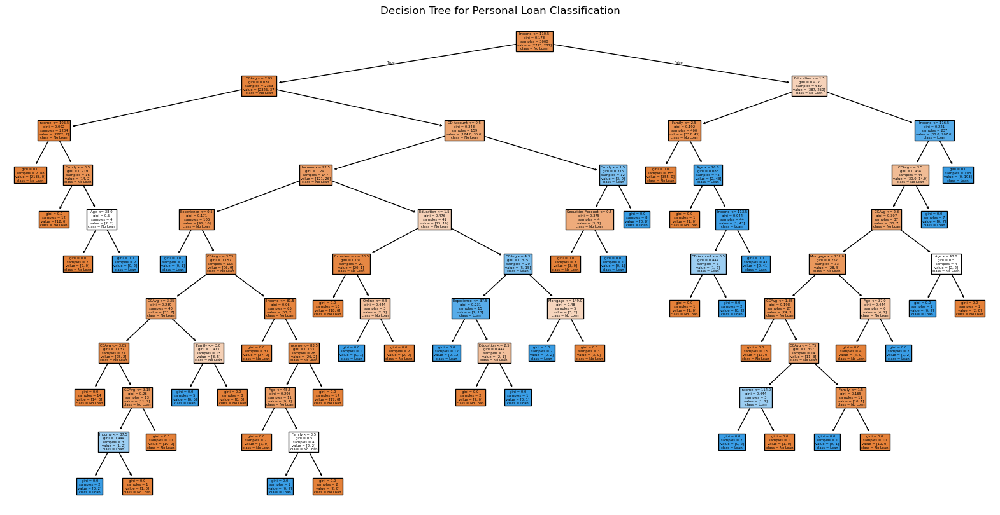

In [30]:
# Train a default Decision Tree Classifier on the training set
tree_classifier = DecisionTreeClassifier(random_state=42)
tree_classifier.fit(train_X, train_y)

# Visualize the decision tree
plt.figure(figsize=(20, 10))
tree.plot_tree(tree_classifier, feature_names=X.columns, class_names=['No Loan', 'Loan'], filled=True)
plt.title("Decision Tree for Personal Loan Classification")
plt.show()

Small Classification Tree with Control Parameters


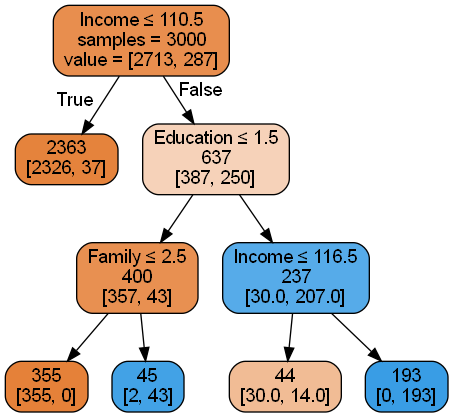

In [31]:
# Create a smaller classification tree for training partition using DecisionTreeClassifier() function control parameters:
#  - Maximum Tree depth (number of splits) = 30;
#  - Minimum impurity decrease per split = 0.01 
#  - Minimum number of sample records in a node for splitting = 20.   
smallClassTree = DecisionTreeClassifier(max_depth=30, 
        min_impurity_decrease=0.01, min_samples_split=20)
smallClassTree.fit(train_X, train_y)

# Display classification tree for training partition.
print('Small Classification Tree with Control Parameters')
plotDecisionTree(smallClassTree, feature_names=train_X.columns)

In [32]:
# Question 2

In [34]:
#Load the dataset
ebay_df = pd.read_csv('eBayAuctions.csv')
ebay_df.head()

,Category,currency,sellerRating,Duration,endDay,ClosePrice,OpenPrice,Competitive?
0,Music/Movie/Game,US,3249,5,Mon,0.01,0.01,0
1,Music/Movie/Game,US,3249,5,Mon,0.01,0.01,0
2,Music/Movie/Game,US,3249,5,Mon,0.01,0.01,0
3,Music/Movie/Game,US,3249,5,Mon,0.01,0.01,0
4,Music/Movie/Game,US,3249,5,Mon,0.01,0.01,0


In [35]:
# Clean the column names
ebay_df.columns = (
    ebay_df.columns
    .str.strip()                # Remove leading and trailing spaces
    .str.lower()                # Convert to lowercase
    .str.replace(' ', '_')      # Replace spaces with underscores
    .str.replace(':', '_')      # Replace colons with underscores
    .str.replace('-', '_')      # Replace hyphens with underscores
    .str.replace(r'[^a-zA-Z0-9_]', '', regex=True)  # Remove special characters
)

# Display cleaned column names
print("Cleaned Column Names:", ebay_df.columns.tolist())

Cleaned Column Names: ['category', 'currency', 'sellerrating', 'duration', 'endday', 'closeprice', 'openprice', 'competitive']


In [36]:
ebay_df = pd.get_dummies(ebay_df, prefix_sep='_', drop_first=True)
ebay_df.columns

Index(['sellerrating', 'duration', 'closeprice', 'openprice', 'competitive',
       'category_Automotive', 'category_Books', 'category_Business/Industrial',
       'category_Clothing/Accessories', 'category_Coins/Stamps',
       'category_Collectibles', 'category_Computer', 'category_Electronics',
       'category_EverythingElse', 'category_Health/Beauty',
       'category_Home/Garden', 'category_Jewelry', 'category_Music/Movie/Game',
       'category_Photography', 'category_Pottery/Glass',
       'category_SportingGoods', 'category_Toys/Hobbies', 'currency_GBP',
       'currency_US', 'endday_Mon', 'endday_Sat', 'endday_Sun', 'endday_Thu',
       'endday_Tue', 'endday_Wed'],
      dtype='object')

In [37]:
#Separate X and y variables
X=ebay_df.drop(columns=['competitive'])
y=ebay_df['competitive']
#Partition
train_X, valid_X, train_y, valid_y = train_test_split(X, y, test_size=0.4, random_state=1)

In [38]:
#Develop trees
ebayTree = DecisionTreeClassifier(min_samples_split=50, max_depth=7,random_state=0)
ebayTree.fit(train_X, train_y)
classificationSummary(train_y, ebayTree.predict(train_X))

Confusion Matrix (Accuracy 0.8757)

       Prediction
Actual   0   1
     0 510  43
     1 104 526


In [39]:
#Calculate both for training data as well as validation data
classificationSummary(valid_y, ebayTree.predict(valid_X))

Confusion Matrix (Accuracy 0.8390)

       Prediction
Actual   0   1
     0 321  32
     1  95 341


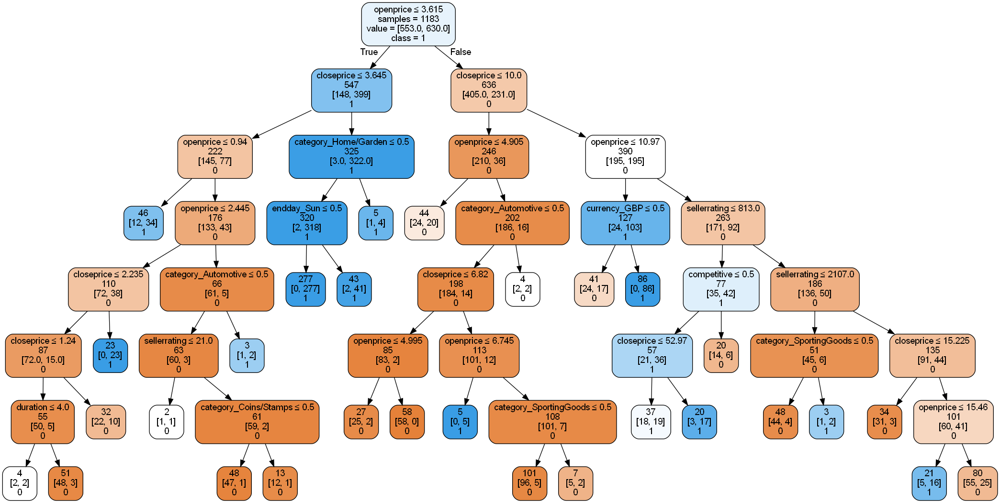

In [40]:
plotDecisionTree(ebayTree, feature_names=ebay_df.columns[:29], class_names=ebayTree.classes_)

In [41]:
ebay_df_mod=ebay_df.drop(columns=['closeprice'])

In [42]:
#Separate X and y variables
X1=ebay_df_mod.drop(columns=['competitive'])
y1=ebay_df_mod['competitive']
#Partition
train_X1, valid_X1, train_y1, valid_y1 = train_test_split(X1, y1, test_size=0.4, random_state=1)

In [43]:
#Develop trees
ebayTree1 = DecisionTreeClassifier(min_samples_split=50, max_depth=7,random_state=0)
ebayTree1.fit(train_X1, train_y1)
classificationSummary(train_y1, ebayTree1.predict(train_X1))

Confusion Matrix (Accuracy 0.7574)

       Prediction
Actual   0   1
     0 414 139
     1 148 482


In [44]:
#Calculate both for training data as well as validation data
classificationSummary(valid_y1, ebayTree1.predict(valid_X1))

Confusion Matrix (Accuracy 0.7212)

       Prediction
Actual   0   1
     0 253 100
     1 120 316


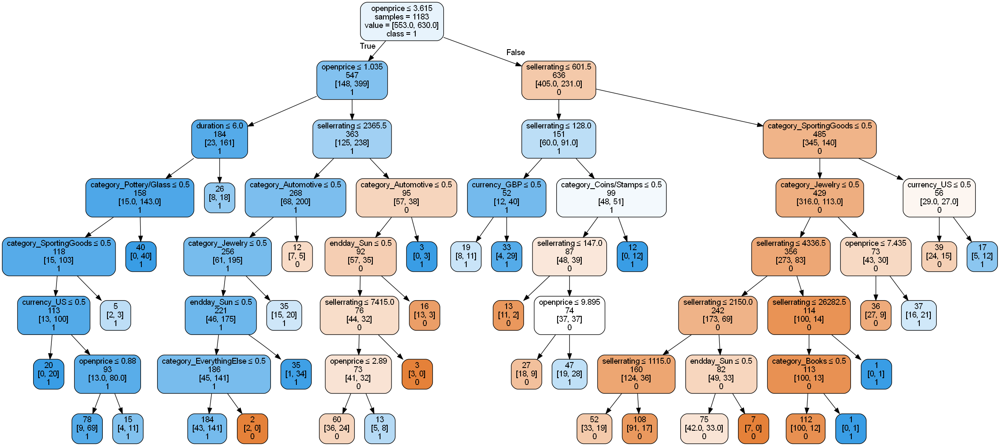

In [45]:
plotDecisionTree(ebayTree1, feature_names=ebay_df_mod.columns[:28], class_names=ebayTree1.classes_)

In [47]:
# Question 3

In [49]:
file_path = 'case3.xlsx'

# Read the specific sheet into a DataFrame
osum_df = pd.read_excel(file_path, sheet_name='Training Data 20000')
test_df= pd.read_excel(file_path, sheet_name='Test Data for LR and DT')
# Display the first few rows of the DataFrame
#print(osum_df.head())

In [50]:
# Display current column names
print("Original Column Names:", osum_df.columns.tolist())

# Clean the column names
osum_df.columns = (
    osum_df.columns
    .str.strip()                # Remove leading and trailing spaces
    .str.lower()                # Convert to lowercase
    .str.replace(' ', '_')      # Replace spaces with underscores
    .str.replace(':', '_')      # Replace colons with underscores
    .str.replace('-', '_')      # Replace hyphens with underscores
    .str.replace(r'[^a-zA-Z0-9_]', '', regex=True)  # Remove special characters
)

# Display cleaned column names
print("Cleaned Column Names:", osum_df.columns.tolist())


Original Column Names: ['SO', 'ATD', 'CHB', 'M', 'Alarm Tag Type', 'Flow', 'Level', 'Pressure', 'Temperature', 'Others', 'H', 'Hour:0-6', 'Hour:7-12', 'Hour:13-18', 'Hour:19-24', 'Week', '1st Week', '2nd week', '3rd week', '4th week']
Cleaned Column Names: ['so', 'atd', 'chb', 'm', 'alarm_tag_type', 'flow', 'level', 'pressure', 'temperature', 'others', 'h', 'hour_0_6', 'hour_7_12', 'hour_13_18', 'hour_19_24', 'week', '1st_week', '2nd_week', '3rd_week', '4th_week']


In [51]:
columns_to_drop = ['so','h', 'hour_0_6', 'alarm_tag_type', 'flow', 'week', '1st_week']

# Drop the specified columns
osum_df = osum_df.drop(columns=columns_to_drop)

# Check the resulting DataFrame
print(osum_df.head())

   atd  chb   m  level  pressure  temperature  others  hour_7_12  hour_13_18  \
0    0    0   6      0         0            0       1          1           0   
1    0    0   7      0         0            0       1          0           1   
2    0    0   7      0         0            0       1          0           1   
3    0    0  10      0         0            0       1          0           1   
4    0    0  10      0         0            0       1          1           0   

   hour_19_24  2nd_week  3rd_week  4th_week  
0           0         0         0         1  
1           0         1         0         0  
2           0         1         0         0  
3           0         1         0         0  
4           0         1         0         0  


In [54]:
#Partition the data into train and valid. Make sure you set seed
# random_state is set to a defined value to get the same partitions when re-running the code
trainData= osum_df.sample(frac=0.6, random_state=1)
# assign rows that are not already in the training set, into validation 
validData =osum_df.drop(trainData.index)

In [53]:
trainData.head()

,atd,chb,m,level,pressure,temperature,others,hour_7_12,hour_13_18,hour_19_24,2nd_week,3rd_week,4th_week
11456,46,0,9,0,0,0,1,1,0,0,0,0,1
16528,286,0,6,0,0,1,0,0,1,0,0,0,0
3253,5,1,8,0,1,0,0,1,0,0,1,0,0
18614,910,0,1,0,0,0,1,0,0,1,0,0,1
1544,5,1,11,0,0,0,0,0,0,1,0,0,0


In [55]:
trainData.columns

Index(['atd', 'chb', 'm', 'level', 'pressure', 'temperature', 'others',
       'hour_7_12', 'hour_13_18', 'hour_19_24', '2nd_week', '3rd_week',
       '4th_week'],
      dtype='object')

In [56]:
# Display current column names
print("Original test Column Names:", test_df.columns.tolist())

# Clean the column names
test_df.columns = (
    test_df.columns
    .str.strip()                # Remove leading and trailing spaces
    .str.lower()                # Convert to lowercase
    .str.replace(' ', '_')      # Replace spaces with underscores
    .str.replace(':', '_')      # Replace colons with underscores
    .str.replace('-', '_')      # Replace hyphens with underscores
    .str.replace(r'[^a-zA-Z0-9_]', '', regex=True)  # Remove special characters
)

# Display cleaned column names
print("Cleaned test Column Names:", test_df.columns.tolist())

Original test Column Names: ['S NO', 'SO', 'ATD', 'CHB', 'M', 'Alarm Tag Type', 'Flow', 'Level', 'Others', 'Pressure', 'Temperature', 'H', 'Hour 0-6', 'Hour 7-12', 'Hour 13-18', 'Hour 19-24', 'D', '1st Week', '2nd Week', '3rd Week', '4th Week', 'Z', 'Exp(Z)', 'P(Y=1)', 'Unnamed: 24', 'Unnamed: 25']
Cleaned test Column Names: ['s_no', 'so', 'atd', 'chb', 'm', 'alarm_tag_type', 'flow', 'level', 'others', 'pressure', 'temperature', 'h', 'hour_0_6', 'hour_7_12', 'hour_13_18', 'hour_19_24', 'd', '1st_week', '2nd_week', '3rd_week', '4th_week', 'z', 'expz', 'py1', 'unnamed__24', 'unnamed__25']


In [57]:
columns_to_drop = ['s_no','so','h', 'hour_0_6', 'alarm_tag_type', 'flow','d', '1st_week','z', 'expz', 'py1', 'unnamed__24', 'unnamed__25']

# Drop the specified columns
test_df = test_df.drop(columns=columns_to_drop)

# Check the resulting DataFrame
print(test_df.head())

   atd  chb  m  level  others  pressure  temperature  hour_7_12  hour_13_18  \
0    1    0  4      0       0         1            0          0           0   
1    1    0  4      0       0         1            0          0           0   
2    1    0  4      0       0         1            0          0           0   
3    1    0  4      0       0         1            0          0           0   
4    1    0  4      0       0         1            0          0           0   

   hour_19_24  2nd_week  3rd_week  4th_week  
0           1         0         1         0  
1           1         0         1         0  
2           1         0         1         0  
3           1         0         1         0  
4           1         0         1         0  


In [58]:
scaler = preprocessing.StandardScaler()
scaler.fit(trainData[['atd', 'm']])  # Note the use of an array of column names

# Transform the full dataset
osumNorm = pd.concat([pd.DataFrame(scaler.transform(osum_df[['atd', 'm']]), 
                                    columns=['zatd', 'zm']),
                       osum_df[['chb', 'level', 'pressure', 'temperature', 'others',
       'hour_7_12', 'hour_13_18', 'hour_19_24', '2nd_week', '3rd_week',
       '4th_week']]], axis=1)
trainNorm = osumNorm.iloc[trainData.index]
#Similarly, get the valid one as well
validNorm = osumNorm.iloc[validData.index]

#Scale the new data
# Transform the full dataset
testNorm = pd.concat([pd.DataFrame(scaler.transform(test_df[['atd', 'm']]), 
                                    columns=['zatd', 'zm']),
                       test_df[['chb', 'level', 'pressure', 'temperature', 'others',
       'hour_7_12', 'hour_13_18', 'hour_19_24', '2nd_week', '3rd_week',
       '4th_week']]], axis=1)

In [59]:
trainNorm.head()
trainNorm.columns

Index(['zatd', 'zm', 'chb', 'level', 'pressure', 'temperature', 'others',
       'hour_7_12', 'hour_13_18', 'hour_19_24', '2nd_week', '3rd_week',
       '4th_week'],
      dtype='object')

In [60]:
testNorm.head()

,zatd,zm,chb,level,pressure,temperature,others,hour_7_12,hour_13_18,hour_19_24,2nd_week,3rd_week,4th_week
0,-0.481397,-0.772193,0,0,1,0,0,0,0,1,0,1,0
1,-0.481397,-0.772193,0,0,1,0,0,0,0,1,0,1,0
2,-0.481397,-0.772193,0,0,1,0,0,0,0,1,0,1,0
3,-0.481397,-0.772193,0,0,1,0,0,0,0,1,0,1,0
4,-0.481397,-0.772193,0,0,1,0,0,0,0,1,0,1,0


In [61]:
knn = KNeighborsClassifier(n_neighbors=3).fit(trainNorm[['zatd', 'zm', 'level', 'pressure', 'temperature', 'others',
       'hour_7_12', 'hour_13_18', 'hour_19_24', '2nd_week', '3rd_week',
       '4th_week']], trainNorm['chb'])
#print(trainNorm.iloc[indices[0], :])

In [62]:
valid_pred=knn.predict(validNorm[['zatd', 'zm', 'level', 'pressure', 'temperature', 'others',
       'hour_7_12', 'hour_13_18', 'hour_19_24', '2nd_week', '3rd_week',
       '4th_week']])

In [63]:
print(valid_pred)
print(validNorm['chb'])

[0 0 0 ... 0 0 0]
1        0
2        0
3        0
9        0
10       0
        ..
19986    0
19987    0
19988    0
19989    0
19998    0
Name: chb, Length: 8000, dtype: int64


In [64]:
accuracy_score(validNorm['chb'] ,valid_pred)

0.8895

In [66]:
train_X = trainNorm[['zatd', 'zm', 'level', 'pressure', 'temperature', 'others','hour_7_12', 'hour_13_18', 'hour_19_24', '2nd_week', '3rd_week','4th_week']]
train_y = trainNorm['chb']
valid_X = validNorm[['zatd', 'zm', 'level', 'pressure', 'temperature', 'others','hour_7_12', 'hour_13_18', 'hour_19_24', '2nd_week', '3rd_week','4th_week']]
valid_y = validNorm['chb']

# Train a classifier for different values of k
results = []
for k in range(1, 30):
    knn = KNeighborsClassifier(n_neighbors=k).fit(train_X, train_y)
    results.append({
        'k': k,
        'accuracy': accuracy_score(valid_y, knn.predict(valid_X))
    })

# Convert results to a pandas data frame
results = pd.DataFrame(results)
print(results)

     k  accuracy
0    1  0.876875
1    2  0.880500
2    3  0.889500
3    4  0.893375
4    5  0.895000
5    6  0.897375
6    7  0.895500
7    8  0.895750
8    9  0.892875
9   10  0.893125
10  11  0.893125
11  12  0.894250
12  13  0.891375
13  14  0.891000
14  15  0.890250
15  16  0.889125
16  17  0.888125
17  18  0.888000
18  19  0.884750
19  20  0.882750
20  21  0.879375
21  22  0.880250
22  23  0.878500
23  24  0.877875
24  25  0.876375
25  26  0.877375
26  27  0.874250
27  28  0.875125
28  29  0.873250


In [67]:
knn1 = KNeighborsClassifier(n_neighbors=6).fit(trainNorm[['zatd', 'zm', 'level', 'pressure', 'temperature', 'others',
       'hour_7_12', 'hour_13_18', 'hour_19_24', '2nd_week', '3rd_week',
       '4th_week']], trainNorm['chb'])

In [68]:
valid_pred1=knn1.predict(validNorm[['zatd', 'zm', 'level', 'pressure', 'temperature', 'others',
       'hour_7_12', 'hour_13_18', 'hour_19_24', '2nd_week', '3rd_week',
       '4th_week']])

In [69]:
print(valid_pred1)
print(validNorm['chb'])

[0 0 0 ... 0 0 0]
1        0
2        0
3        0
9        0
10       0
        ..
19986    0
19987    0
19988    0
19989    0
19998    0
Name: chb, Length: 8000, dtype: int64


In [70]:
accuracy_score(validNorm['chb'] ,valid_pred1)

0.897375

In [71]:
test_pred=knn1.predict(testNorm[['zatd', 'zm', 'level', 'pressure', 'temperature', 'others',
       'hour_7_12', 'hour_13_18', 'hour_19_24', '2nd_week', '3rd_week',
       '4th_week']])

In [72]:
accuracy_score(testNorm['chb'] ,test_pred)

0.7935

In [73]:
# decision tree
file_path = 'case3.xlsx'

# Read the specific sheet into a DataFrame
osum_df = pd.read_excel(file_path, sheet_name='Training Data 20000')

# Display the first few rows of the DataFrame
print(osum_df.head())

        SO  ATD  CHB   M Alarm Tag Type  Flow  Level  Pressure  Temperature  \
0  XI-3057    0    0   6         Others     0      0         0            0   
1  XI-3057    0    0   7         Others     0      0         0            0   
2  XI-3057    0    0   7         Others     0      0         0            0   
3  XI-3057    0    0  10         Others     0      0         0            0   
4  XI-3057    0    0  10         Others     0      0         0            0   

   Others      H  Hour:0-6  Hour:7-12  Hour:13-18  Hour:19-24      Week  \
0       1   7-12         0          1           0           0  4th Week   
1       1  13-18         0          0           1           0  2nd Week   
2       1  13-18         0          0           1           0  2nd Week   
3       1  13-18         0          0           1           0  2nd Week   
4       1   7-12         0          1           0           0  2nd Week   

   1st Week  2nd week  3rd week  4th week  
0         0         0         

In [74]:
# Display current column names
print("Original Column Names:", osum_df.columns.tolist())

# Clean the column names
osum_df.columns = (
    osum_df.columns
    .str.strip()                # Remove leading and trailing spaces
    .str.lower()                # Convert to lowercase
    .str.replace(' ', '_')      # Replace spaces with underscores
    .str.replace(':', '_')      # Replace colons with underscores
    .str.replace('-', '_')      # Replace hyphens with underscores
    .str.replace(r'[^a-zA-Z0-9_]', '', regex=True)  # Remove special characters
)

# Display cleaned column names
print("Cleaned Column Names:", osum_df.columns.tolist())

Original Column Names: ['SO', 'ATD', 'CHB', 'M', 'Alarm Tag Type', 'Flow', 'Level', 'Pressure', 'Temperature', 'Others', 'H', 'Hour:0-6', 'Hour:7-12', 'Hour:13-18', 'Hour:19-24', 'Week', '1st Week', '2nd week', '3rd week', '4th week']
Cleaned Column Names: ['so', 'atd', 'chb', 'm', 'alarm_tag_type', 'flow', 'level', 'pressure', 'temperature', 'others', 'h', 'hour_0_6', 'hour_7_12', 'hour_13_18', 'hour_19_24', 'week', '1st_week', '2nd_week', '3rd_week', '4th_week']


In [75]:
columns_to_drop = ['so','h', 'hour_0_6', 'alarm_tag_type', 'flow', 'week', '1st_week']

# Drop the specified columns
osum_df = osum_df.drop(columns=columns_to_drop)

# Check the resulting DataFrame
print(osum_df.head())

   atd  chb   m  level  pressure  temperature  others  hour_7_12  hour_13_18  \
0    0    0   6      0         0            0       1          1           0   
1    0    0   7      0         0            0       1          0           1   
2    0    0   7      0         0            0       1          0           1   
3    0    0  10      0         0            0       1          0           1   
4    0    0  10      0         0            0       1          1           0   

   hour_19_24  2nd_week  3rd_week  4th_week  
0           0         0         0         1  
1           0         1         0         0  
2           0         1         0         0  
3           0         1         0         0  
4           0         1         0         0  


In [76]:
#Separate X and y variables
X=osum_df.drop(columns=['chb'])
y=osum_df['chb']
#Partition
train_X, valid_X, train_y, valid_y = train_test_split(X, y, test_size=0.4, random_state=1)

In [77]:
#Develop trees
osumTree = DecisionTreeClassifier(random_state=0, max_depth=20)
osumTree.fit(train_X, train_y)
classificationSummary(train_y, osumTree.predict(train_X))

Confusion Matrix (Accuracy 0.9637)

       Prediction
Actual    0    1
     0 9121  161
     1  275 2443


In [78]:
#Calculate both for training data as well as validation data
classificationSummary(valid_y, osumTree.predict(valid_X))

Confusion Matrix (Accuracy 0.8790)

       Prediction
Actual    0    1
     0 5670  482
     1  486 1362


dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.488033 to fit

(process:16804): GLib-GIO-WARNING **: 23:15:15.911: Unexpectedly, UWP app `Microsoft.OutlookForWindows_1.2024.916.200_x64__8wekyb3d8bbwe' (AUMId `Microsoft.OutlookForWindows_8wekyb3d8bbwe!Microsoft.OutlookforWindows') supports 4 extensions but has no verbs

(process:16804): GLib-GIO-WARNING **: 23:15:16.300: Unexpectedly, UWP app `Microsoft.ScreenSketch_11.2409.25.0_x64__8wekyb3d8bbwe' (AUMId `Microsoft.ScreenSketch_8wekyb3d8bbwe!App') supports 29 extensions but has no verbs

(process:16804): GLib-GIO-WARNING **: 23:15:16.326: Unexpectedly, UWP app `Clipchamp.Clipchamp_3.1.11920.0_neutral__yxz26nhyzhsrt' (AUMId `Clipchamp.Clipchamp_yxz26nhyzhsrt!App') supports 41 extensions but has no verbs


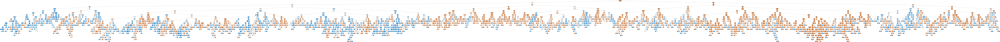

In [79]:
plotDecisionTree(osumTree, feature_names=osum_df.columns[:12], class_names=osumTree.classes_)

In [80]:
test_df= pd.read_excel(file_path, sheet_name='Test Data for LR and DT')

In [81]:
# Display current column names
print("Original test Column Names:", test_df.columns.tolist())

# Clean the column names
test_df.columns = (
    test_df.columns
    .str.strip()                # Remove leading and trailing spaces
    .str.lower()                # Convert to lowercase
    .str.replace(' ', '_')      # Replace spaces with underscores
    .str.replace(':', '_')      # Replace colons with underscores
    .str.replace('-', '_')      # Replace hyphens with underscores
    .str.replace(r'[^a-zA-Z0-9_]', '', regex=True)  # Remove special characters
)

# Display cleaned column names
print("Cleaned test Column Names:", test_df.columns.tolist())

Original test Column Names: ['S NO', 'SO', 'ATD', 'CHB', 'M', 'Alarm Tag Type', 'Flow', 'Level', 'Others', 'Pressure', 'Temperature', 'H', 'Hour 0-6', 'Hour 7-12', 'Hour 13-18', 'Hour 19-24', 'D', '1st Week', '2nd Week', '3rd Week', '4th Week', 'Z', 'Exp(Z)', 'P(Y=1)', 'Unnamed: 24', 'Unnamed: 25']
Cleaned test Column Names: ['s_no', 'so', 'atd', 'chb', 'm', 'alarm_tag_type', 'flow', 'level', 'others', 'pressure', 'temperature', 'h', 'hour_0_6', 'hour_7_12', 'hour_13_18', 'hour_19_24', 'd', '1st_week', '2nd_week', '3rd_week', '4th_week', 'z', 'expz', 'py1', 'unnamed__24', 'unnamed__25']


In [82]:
columns_to_drop = ['s_no','so','h', 'hour_0_6', 'alarm_tag_type', 'flow','d', '1st_week','z', 'expz', 'py1', 'unnamed__24', 'unnamed__25']

# Drop the specified columns
test_df = test_df.drop(columns=columns_to_drop)

# Check the resulting DataFrame
print(test_df.head())

   atd  chb  m  level  others  pressure  temperature  hour_7_12  hour_13_18  \
0    1    0  4      0       0         1            0          0           0   
1    1    0  4      0       0         1            0          0           0   
2    1    0  4      0       0         1            0          0           0   
3    1    0  4      0       0         1            0          0           0   
4    1    0  4      0       0         1            0          0           0   

   hour_19_24  2nd_week  3rd_week  4th_week  
0           1         0         1         0  
1           1         0         1         0  
2           1         0         1         0  
3           1         0         1         0  
4           1         0         1         0  


In [83]:
test_df = test_df[osum_df.columns]

In [84]:
#Separate X and y variables
X_test=test_df.drop(columns=['chb'])
y_test=test_df['chb']

In [85]:
classificationSummary(y_test, osumTree.predict(X_test))

Confusion Matrix (Accuracy 0.8155)

       Prediction
Actual    0    1
     0 1242  273
     1   96  389



(process:8280): GLib-GIO-WARNING **: 23:16:19.688: Unexpectedly, UWP app `Microsoft.OutlookForWindows_1.2024.916.200_x64__8wekyb3d8bbwe' (AUMId `Microsoft.OutlookForWindows_8wekyb3d8bbwe!Microsoft.OutlookforWindows') supports 4 extensions but has no verbs

(process:8280): GLib-GIO-WARNING **: 23:16:19.907: Unexpectedly, UWP app `Microsoft.ScreenSketch_11.2409.25.0_x64__8wekyb3d8bbwe' (AUMId `Microsoft.ScreenSketch_8wekyb3d8bbwe!App') supports 29 extensions but has no verbs

(process:8280): GLib-GIO-WARNING **: 23:16:19.928: Unexpectedly, UWP app `Clipchamp.Clipchamp_3.1.11920.0_neutral__yxz26nhyzhsrt' (AUMId `Clipchamp.Clipchamp_yxz26nhyzhsrt!App') supports 41 extensions but has no verbs
dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.488033 to fit


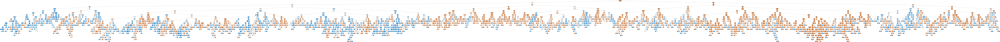

In [86]:
plotDecisionTree(osumTree, feature_names=test_df.columns[:12], class_names=osumTree.classes_)